# 3.6.1 Credit Card Fraud

Using this credit card fraud dataset develop an algorithm to predict fraud. Prioritize correctly finding fraud rather than correctly labeling non-fraudulent transactions.

__Data Source__: Kaggle Data Set

__Description__: The datasets contains transactions made by credit cards in September 2013 by european cardholders. This dataset presents transactions that occurred in two days, where we have 492 frauds out of 284,807 transactions. The dataset is highly unbalanced, the positive class (frauds) account for 0.172% of all transactions.

It contains only numerical input variables which are the result of a PCA transformation. Unfortunately, due to confidentiality issues, we cannot provide the original features and more background information about the data. Features V1, V2, ... V28 are the principal components obtained with PCA, the only features which have not been transformed with PCA are 'Time' and 'Amount'. Feature 'Time' contains the seconds elapsed between each transaction and the first transaction in the dataset. The feature 'Amount' is the transaction Amount, this feature can be used for example-dependant cost-senstive learning. Feature 'Class' is the response variable and it takes value 1 in case of fraud and 0 otherwise.

In [1]:
import numpy as np
current_state = np.random.get_state()
np.random.set_state(current_state)
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
import time 
from sklearn import metrics
import random
import plotly.offline as py
import plotly.graph_objs as go
py.init_notebook_mode(connected=True)

# Models
from sklearn.naive_bayes import BernoulliNB # Naive Bayes
from sklearn.neighbors import KNeighborsClassifier # KNN Classifier
from sklearn import ensemble # RandomForestClassifier(), GradientBoostingClassifier()
from sklearn import linear_model # LogisticRegression(penalty = 'l1') OLS, RidgeClassifier(), LogisticRegression(penalty = 'l2') Lasso Classifier
from sklearn import svm
from sklearn.metrics import confusion_matrix

### Data exploration

In [2]:
data_path = 'creditcard.csv'
df = pd.read_csv(data_path)
print ("Shape of data: ", df.shape)
display(df.head(5))

Shape of data:  (284807, 31)


,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [3]:
#Normalizing
#Check reference: https://stackoverflow.com/questions/12525722/normalize-data-in-pandas/12525836
df_norm = (df - df.min()) / (df.max() - df.min())
display(df_norm.head(1))

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,0.935192,0.76649,0.881365,0.313023,0.763439,0.267669,0.266815,0.786444,0.475312,...,0.561184,0.522992,0.663793,0.391253,0.585122,0.394557,0.418976,0.312697,0.005824,0.0


In [4]:
df_norm = (df - df.min()) / (df.max() - df.min())
# Input and outcome variables
X = df_norm[list(set(list(df_norm.columns)) - set(['Class']))]
Y = df['Class']

In [5]:
# T-test on Class groups
df_fraud = df_norm[df_norm['Class'] == 1]
df_non_fraud = df_norm[df_norm['Class'] == 0]
tvals = []
pvals = []

for col in df_norm.columns:
    tval, pval = stats.ttest_ind(df_fraud[col], df_non_fraud[col], equal_var=False)
    tvals.append(tval)
    pvals.append(pval)

# Tval, pval
df_t = pd.DataFrame()
df_t['Column'] = df_norm.columns
df_t['T-value'] = tvals
df_t['P-value'] = pvals

In [6]:
# plotly histograms (drop down menu) and t/p values
fraud = go.Histogram(
    x=df_fraud['V10'],
    opacity=0.75,
    histnorm='probability'

)
non_fraud = go.Histogram(
    x=df_non_fraud['V17'],
    opacity=0.75,
    histnorm='probability'

)

data = [fraud, non_fraud]
layout = go.Layout(barmode='overlay')
fig = go.Figure(data=data, layout=layout)

py.iplot(fig, filename='overlaid histogram')

## Models

In [7]:
df_eval = pd.DataFrame()
evals = np.zeros(3)

# Holdout: split fraud and non_fraud
fraud_idx = list(Y[Y == 1].index)
random.shuffle(fraud_idx)

non_fraud_idx = list(set(Y.index) - set(fraud_idx))
random.shuffle(non_fraud_idx)

fraud_train_idx = fraud_idx[:int(0.7 * len(fraud_idx))]
fraud_test_idx = fraud_idx[int(0.7 * len(fraud_idx)):]

non_fraud_train_idx = non_fraud_idx[:int(0.1 * len(non_fraud_idx))]
non_fraud_test_idx = non_fraud_idx[int(0.1 * len(non_fraud_idx)):]

train_idx = fraud_train_idx + non_fraud_train_idx
test_idx = fraud_test_idx + non_fraud_test_idx

# Holdout groups

X_train = X.iloc[train_idx]
X_test = X.iloc[test_idx]
Y_train = Y.iloc[train_idx]
Y_test = Y.iloc[test_idx]

In [8]:
def evaluate(model_name, Y_pred):
    cross_tab = pd.crosstab(Y_test, Y_pred)
    # accuracy
    evals[0] = (cross_tab.iloc[0,0] + cross_tab.iloc[1,1]) / cross_tab.sum().sum()
    # recall
    evals[1] = cross_tab.iloc[1,1] / (cross_tab.iloc[1,0] + cross_tab.iloc[1,1])
    # auc score
    fpr, tpr, thresholds = metrics.roc_curve(Y_test, Y_pred, pos_label=1)
    auc = metrics.auc(fpr, tpr)
    evals[2] = auc
    df_eval[model_name] = evals

In [9]:
# Baseline: non-fraudulent
start = time.time()
base_pred = np.zeros(len(Y_test) - 1)
base_pred = np.append(base_pred, 1)
print ("Runtime %0.2f" % (time.time() - start))
evaluate('Baseline', base_pred)

Runtime 0.00


In [10]:
# Naive Bayes
start = time.time()
bnb = BernoulliNB()
bnb.fit(X_train,Y_train)
bnb_pred = bnb.predict(X_test)
print ("Runtime %0.2f" % (time.time() - start))
evaluate('Naive Bayes', bnb_pred)

Runtime 1.24


Recall for the Naive Bayes model is: 0.0


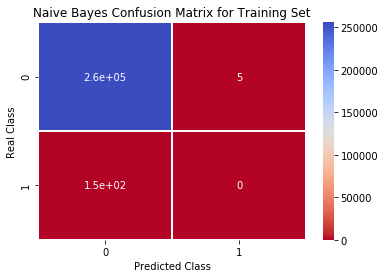

In [11]:
conf_matrix_bnb = confusion_matrix(Y_test, bnb_pred)
# Calculating recall from confusion matrix
recall_bnb = conf_matrix_bnb[1,1]/(conf_matrix_bnb[1,1]+conf_matrix_bnb[1,0])
print('Recall for the Naive Bayes model is: {}'.format(recall_bnb))

#creating heatmap of confusion matrix
sns.heatmap(conf_matrix_bnb, 
            cmap='coolwarm_r', 
            annot=True, 
            linewidths=0.5)
plt.title('Naive Bayes Confusion Matrix for Training Set')
plt.xlabel('Predicted Class')
plt.ylabel('Real Class')
plt.show()

In [12]:
# KNN Classifier
start = time.time()
knn_model = KNeighborsClassifier(n_neighbors=1, algorithm='ball_tree', n_jobs = 5)
knn_model.fit(X_train, Y_train)
knn_pred = knn_model.predict(X_test)
print ("Runtime %0.2f" % (time.time() - start))
evaluate('KNN',knn_pred)

Runtime 297.31


Recall for the KNN model is: 0.8243243243243243


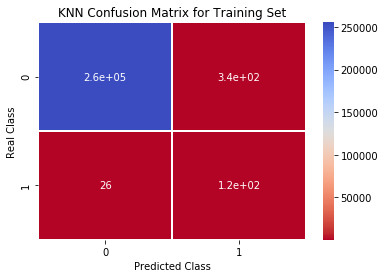

In [13]:
conf_matrix_knn = confusion_matrix(Y_test, knn_pred)
# Calculating recall from confusion matrix
recall_knn = conf_matrix_knn[1,1]/(conf_matrix_knn[1,1]+conf_matrix_knn[1,0])
print('Recall for the KNN model is: {}'.format(recall_knn))

#creating heatmap of confusion matrix
sns.heatmap(conf_matrix_knn, 
            cmap='coolwarm_r', 
            annot=True, 
            linewidths=0.5)
plt.title('KNN Confusion Matrix for Training Set')
plt.xlabel('Predicted Class')
plt.ylabel('Real Class')
plt.show()

In [14]:
# RandomForestClassifier 
start = time.time()
rfc = ensemble.RandomForestClassifier(n_jobs = 3)
rfc.fit(X_train, Y_train)
rfc_pred = rfc.predict(X_test)
print ("Runtime %0.2f" % (time.time() - start))
evaluate('Random Forest', rfc_pred)

Runtime 2.23


Recall for the Random Forest model is: 0.8243243243243243


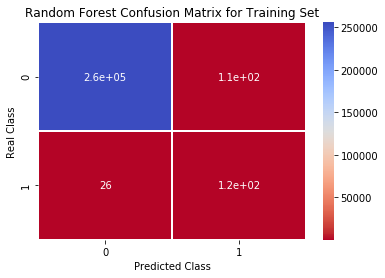

In [15]:
conf_matrix_rfc = confusion_matrix(Y_test, rfc_pred)
# Calculating recall from confusion matrix
recall_rfc = conf_matrix_rfc[1,1]/(conf_matrix_rfc[1,1]+conf_matrix_rfc[1,0])
print('Recall for the Random Forest model is: {}'.format(recall_rfc))

#creating heatmap of confusion matrix
sns.heatmap(conf_matrix_rfc, 
            cmap='coolwarm_r', 
            annot=True, 
            linewidths=0.5)
plt.title('Random Forest Confusion Matrix for Training Set')
plt.xlabel('Predicted Class')
plt.ylabel('Real Class')
plt.show()

In [16]:
# Logistic Regression
start = time.time()
log_reg_model = linear_model.LogisticRegression(penalty = 'l2', C=1e9)
log_reg_model.fit(X_train, Y_train)
log_reg_pred = log_reg_model.predict(X_test)
print ("Runtime %0.2f" % (time.time() - start))
evaluate('Logistic Regression', log_reg_pred)

Runtime 0.98


Recall for the Logistic Regression model is: 0.7972972972972973


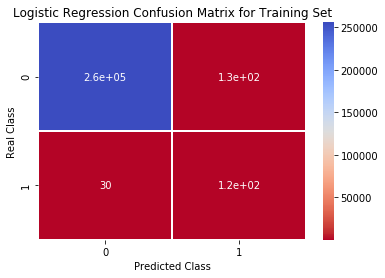

In [17]:
conf_matrix_log_reg = confusion_matrix(Y_test, log_reg_pred)
# Calculating recall from confusion matrix
recall_log_reg = conf_matrix_log_reg[1,1]/(conf_matrix_log_reg[1,1]+conf_matrix_log_reg[1,0])
print('Recall for the Logistic Regression model is: {}'.format(recall_log_reg))

#creating heatmap of confusion matrix
sns.heatmap(conf_matrix_log_reg, 
            cmap='coolwarm_r', 
            annot=True, 
            linewidths=0.5)
plt.title('Logistic Regression Confusion Matrix for Training Set')
plt.xlabel('Predicted Class')
plt.ylabel('Real Class')
plt.show()

In [18]:
# Ridge Classifier
start = time.time()
ridge_model = linear_model.RidgeClassifier(alpha = 1e-4)
ridge_model.fit(X_train, Y_train)
ridge_pred = ridge_model.predict(X_test)
print ("Runtime %0.2f" % (time.time() - start))
evaluate('Ridge Regression', ridge_pred)

Runtime 0.82


Recall for the Ridge Classifier model is: 0.5608108108108109


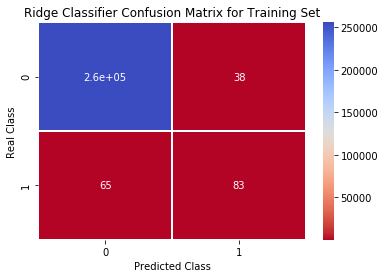

In [19]:
conf_matrix_ridge = confusion_matrix(Y_test, ridge_pred)
# Calculating recall from confusion matrix
recall_ridge = conf_matrix_ridge[1,1]/(conf_matrix_ridge[1,1]+conf_matrix_ridge[1,0])
print('Recall for the Ridge Classifier model is: {}'.format(recall_ridge))

#creating heatmap of confusion matrix
sns.heatmap(conf_matrix_ridge, 
            cmap='coolwarm_r', 
            annot=True, 
            linewidths=0.5)
plt.title('Ridge Classifier Confusion Matrix for Training Set')
plt.xlabel('Predicted Class')
plt.ylabel('Real Class')
plt.show()

In [20]:
# Lasso Classifier
start = time.time()
lasso_model = linear_model.LogisticRegression(penalty = 'l1')
lasso_model.fit(X_train, Y_train)
lasso_pred = lasso_model.predict(X_test)
print ("Runtime %0.2f" % (time.time() - start))
evaluate('Lasso Regression', lasso_pred)

Runtime 4.35


Recall for the Lasso Classifier model is: 0.777027027027027


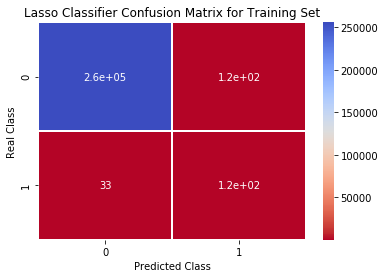

In [21]:
conf_matrix_lasso = confusion_matrix(Y_test, lasso_pred)
# Calculating recall from confusion matrix
recall_lasso = conf_matrix_lasso[1,1]/(conf_matrix_lasso[1,1]+conf_matrix_lasso[1,0])
print('Recall for the Lasso Classifier model is: {}'.format(recall_lasso))

#creating heatmap of confusion matrix
sns.heatmap(conf_matrix_lasso, 
            cmap='coolwarm_r', 
            annot=True, 
            linewidths=0.5)
plt.title('Lasso Classifier Confusion Matrix for Training Set')
plt.xlabel('Predicted Class')
plt.ylabel('Real Class')
plt.show()

In [22]:
# SVClassifier
start = time.time()
svc_model = svm.SVC(C = 100, kernel = 'rbf')
svc_model.fit(X_train, Y_train)
svc_pred = svc_model.predict(X_test)
print ("Runtime %0.2f" % (time.time() - start))
evaluate('SVM', svc_pred)

Runtime 6.84


Recall for the SVC model is: 0.7905405405405406


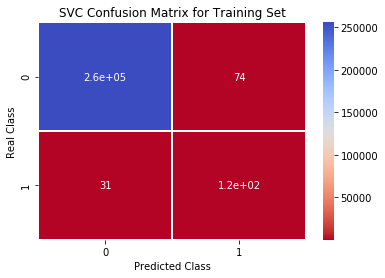

In [23]:
conf_matrix_svc = confusion_matrix(Y_test, svc_pred)
# Calculating recall from confusion matrix
recall_svc = conf_matrix_svc[1,1]/(conf_matrix_svc[1,1]+conf_matrix_svc[1,0])
print('Recall for the SVC model is: {}'.format(recall_svc))

#creating heatmap of confusion matrix
sns.heatmap(conf_matrix_svc, 
            cmap='coolwarm_r', 
            annot=True, 
            linewidths=0.5)
plt.title('SVC Confusion Matrix for Training Set')
plt.xlabel('Predicted Class')
plt.ylabel('Real Class')
plt.show()

In [24]:
# Gradient Boost Classifier
start = time.time()
params = {'n_estimators': 1000,
          'max_depth': 2,
          'learning_rate': 0.001,
          'loss': 'deviance'}
gbc = ensemble.GradientBoostingClassifier(**params)
gbc.fit(X_train, Y_train)
gbc_pred = gbc.predict(X_test)
print ("Runtime %0.2f" % (time.time() - start))
evaluate('Gradient Boost', gbc_pred)

Runtime 94.27


Recall for the Gradient Boost Classifier model is: 0.8175675675675675


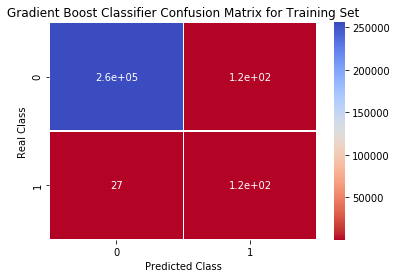

In [25]:
conf_matrix_gbc = confusion_matrix(Y_test, gbc_pred)
# Calculating recall from confusion matrix
recall_lasso = conf_matrix_gbc[1,1]/(conf_matrix_gbc[1,1]+conf_matrix_gbc[1,0])
print('Recall for the Gradient Boost Classifier model is: {}'.format(recall_lasso))

#creating heatmap of confusion matrix
sns.heatmap(conf_matrix_gbc, 
            cmap='coolwarm_r', 
            annot=True, 
            linewidths=0.5)
plt.title('Gradient Boost Classifier Confusion Matrix for Training Set')
plt.xlabel('Predicted Class')
plt.ylabel('Real Class')
plt.show()

In [26]:
df_eval.rename(index={0: 'Accuracy', 
                      1: 'AUC Score', 
                      2: 'Recall'
                     }, inplace = True)

## Evaluation

In [27]:
# Accuracy scores, highlight highest in each row
df_eval.style.highlight_max(axis = 1)

,Baseline,Naive Bayes,KNN,Random Forest,Logistic Regression,Ridge Regression,Lasso Regression,SVM,Gradient Boost
Accuracy,0.999418,0.999402,0.998567,0.999473,0.999371,0.999598,0.999418,0.99959,0.99943
AUC Score,0,0,0.824324,0.824324,0.797297,0.560811,0.777027,0.790541,0.817568
Recall,0.499998,0.49999,0.911496,0.911949,0.898393,0.780331,0.888287,0.895126,0.908551


In [28]:
from sklearn.metrics import f1_score

#printing F1 scores for reach model's predicted values
print('F1 score for Baseline: {}'. format(f1_score(Y_test, base_pred)))
print('F1 score for Naives Bayes: {}'. format(f1_score(Y_test, bnb_pred)))
print('F1 score for KNN: {}'. format(f1_score(Y_test, knn_pred)))
print('F1 score for Random Forest Classification: {}'. format(f1_score(Y_test, rfc_pred)))
print('F1 score for Logistic Regression: {}'.format(f1_score(Y_test, log_reg_pred)))
print('F1 score for Ridge Regression: {}'.format(f1_score(Y_test, ridge_pred)))
print('F1 score for Lasso Regression: {}'.format(f1_score(Y_test, lasso_pred)))
print('F1 score for SVC Classification: {}'. format(f1_score(Y_test, svc_pred)))
print('F1 score for Gradient Boost: {}'. format(f1_score(Y_test, gbc_pred)))

F1 score for Baseline: 0.0
F1 score for Naives Bayes: 0.0
F1 score for KNN: 0.39934533551554824
F1 score for Random Forest Classification: 0.6437994722955146
F1 score for Logistic Regression: 0.5944584382871536
F1 score for Ridge Regression: 0.617100371747212
F1 score for Lasso Regression: 0.6068601583113457
F1 score for SVC Classification: 0.6902654867256638
F1 score for Gradient Boost: 0.6237113402061856


## write-up

Evaluating the performance of the different models we used, we can come to the conlusion that the KNN model prioritizes correctly finding fraud.

The AUC score is the probability that a randomly chosen positive example ranks above a randomly chosen negative example. Recall is  is the fraction of relevant instances that have been retrieved over the total amount of relevant instances. Together, these metrics help us choose which model performs best given our objective.  The different evaluation results we used reveals that KNN has a high accuracy and a high recall value close to 1, indicating that it correctly finds fraud.